In [9]:
import pandas as pd
import numpy as np
from sklearn.model_selection import GridSearchCV, train_test_split
from lightgbm import LGBMClassifier
import lightgbm
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
import plotly.express as px
import xgboost
from xgboost import XGBClassifier
from sklearn.preprocessing import MinMaxScaler
from sklearn.svm import SVC, SVR
from sklearn.manifold import TSNE

In [10]:
from sklearn.preprocessing import LabelEncoder


def convert_category_into_integer(df: pd.DataFrame, columns: list):

    label_encoders = {}  # 각 열의 LabelEncoder 객체를 저장할 딕셔너리입니다.
    
    for column in columns:
        # 각 열에 대해 LabelEncoder 객체를 생성합니다.
        label_encoder = LabelEncoder()
        
        # LabelEncoder를 사용하여 해당 열의 범주형 데이터를 정수형으로 변환합니다.
        df.loc[:, column] = label_encoder.fit_transform(df[column])
        
        # 변환된 LabelEncoder 객체를 딕셔너리에 저장합니다.
        label_encoders.update({column: label_encoder})
    
    # 변환된 데이터프레임과 LabelEncoder 객체를 포함하는 딕셔너리를 반환합니다.
    return df, label_encoders


In [11]:
seed = 0
data_train = pd.read_csv('./data/train.csv')
data_test = pd.read_csv('./data/test.csv')

In [12]:
data_train_dropna = data_train.dropna()

In [13]:
data_train_dropna_labeled, _ = convert_category_into_integer(data_train_dropna, ('Churn','ServiceArea','ChildrenInHH','HandsetRefurbished','HandsetWebCapable','TruckOwner','RVOwner','Homeownership','BuysViaMailOrder','RespondsToMailOffers','OptOutMailings','NonUSTravel','OwnsComputer','HasCreditCard','NewCellphoneUser','NotNewCellphoneUser','OwnsMotorcycle','HandsetPrice','MadeCallToRetentionTeam','CreditRating','PrizmCode','Occupation','MaritalStatus'))

In [14]:
data_train_dropna_labeled[['Churn','ServiceArea','ChildrenInHH','HandsetRefurbished','HandsetWebCapable','TruckOwner','RVOwner','Homeownership','BuysViaMailOrder','RespondsToMailOffers','OptOutMailings','NonUSTravel','OwnsComputer','HasCreditCard','NewCellphoneUser','NotNewCellphoneUser','OwnsMotorcycle','HandsetPrice','MadeCallToRetentionTeam','CreditRating','PrizmCode','Occupation','MaritalStatus']]=data_train_dropna_labeled[['Churn','ServiceArea','ChildrenInHH','HandsetRefurbished','HandsetWebCapable','TruckOwner','RVOwner','Homeownership','BuysViaMailOrder','RespondsToMailOffers','OptOutMailings','NonUSTravel','OwnsComputer','HasCreditCard','NewCellphoneUser','NotNewCellphoneUser','OwnsMotorcycle','HandsetPrice','MadeCallToRetentionTeam','CreditRating','PrizmCode','Occupation','MaritalStatus']].astype(int)

/var/folders/_v/g1qmsq595kq_fg_zv8n2022h0000gn/T/ipykernel_18338/3957736257.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_train_dropna_labeled[['Churn','ServiceArea','ChildrenInHH','HandsetRefurbished','HandsetWebCapable','TruckOwner','RVOwner','Homeownership','BuysViaMailOrder','RespondsToMailOffers','OptOutMailings','NonUSTravel','OwnsComputer','HasCreditCard','NewCellphoneUser','NotNewCellphoneUser','OwnsMotorcycle','HandsetPrice','MadeCallToRetentionTeam','CreditRating','PrizmCode','Occupation','MaritalStatus']]=data_train_dropna_labeled[['Churn','ServiceArea','ChildrenInHH','HandsetRefurbished','HandsetWebCapable','TruckOwner','RVOwner','Homeownership','BuysViaMailOrder','RespondsToMailOffers','OptOutMailings','NonUSTravel','OwnsC

In [7]:
data_train_dropna_labeled.info()

<class 'pandas.core.frame.DataFrame'>
Index: 49752 entries, 0 to 51043
Data columns (total 58 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   CustomerID                 49752 non-null  int64  
 1   Churn                      49752 non-null  int64  
 2   MonthlyRevenue             49752 non-null  float64
 3   MonthlyMinutes             49752 non-null  float64
 4   TotalRecurringCharge       49752 non-null  float64
 5   DirectorAssistedCalls      49752 non-null  float64
 6   OverageMinutes             49752 non-null  float64
 7   RoamingCalls               49752 non-null  float64
 8   PercChangeMinutes          49752 non-null  float64
 9   PercChangeRevenues         49752 non-null  float64
 10  DroppedCalls               49752 non-null  float64
 11  BlockedCalls               49752 non-null  float64
 12  UnansweredCalls            49752 non-null  float64
 13  CustomerCareCalls          49752 non-null  float64


In [10]:
data = pd.DataFrame()

In [12]:
data['Churn'] = data_train_dropna_labeled['Churn']
data['TotalRecurringCharge'] = data_train_dropna_labeled['TotalRecurringCharge']
data['MonthsInService'] = data_train_dropna_labeled['MonthsInService']
data['CurrentEquipmentDays'] = data_train_dropna_labeled['CurrentEquipmentDays']
data['TotalRecurringCharge'] = data_train_dropna_labeled['TotalRecurringCharge']/data_train_dropna_labeled['CurrentEquipmentDays']
data['DirectorAssistedCalls'] = data_train_dropna_labeled['DirectorAssistedCalls']/data_train_dropna_labeled['CurrentEquipmentDays']
data['OverageMinutes'] = data_train_dropna_labeled['OverageMinutes']/data_train_dropna_labeled['CurrentEquipmentDays']
data['RoamingCalls'] = data_train_dropna_labeled['RoamingCalls']/data_train_dropna_labeled['CurrentEquipmentDays']
data['PercChangeMinutes'] = data_train_dropna_labeled['PercChangeMinutes']/data_train_dropna_labeled['CurrentEquipmentDays']
data['PercChangeRevenues'] = data_train_dropna_labeled['PercChangeRevenues']/data_train_dropna_labeled['CurrentEquipmentDays']
data['DroppedCalls'] = data_train_dropna_labeled['DroppedCalls']/data_train_dropna_labeled['CurrentEquipmentDays']
data['BlockedCalls'] = data_train_dropna_labeled['BlockedCalls']/data_train_dropna_labeled['CurrentEquipmentDays']
data['UnansweredCalls'] = data_train_dropna_labeled['UnansweredCalls']/data_train_dropna_labeled['CurrentEquipmentDays']
data['CustomerCareCalls'] = data_train_dropna_labeled['CustomerCareCalls']/data_train_dropna_labeled['CurrentEquipmentDays']
data['ThreewayCalls'] = data_train_dropna_labeled['ThreewayCalls']/data_train_dropna_labeled['CurrentEquipmentDays']


In [15]:
data = data_train_dropna_labeled[['Churn','TotalRecurringCharge',
'MonthsInService',
'CurrentEquipmentDays']]

In [10]:
# data_ = data[data['TotalRecurringCharge']<180]

In [9]:
minmaxscaler_total = MinMaxScaler()


In [9]:
# data_train_dropna_labeled.iloc[:] = minmaxscaler_total.fit_transform(data_train_dropna_labeled)

In [10]:
data.iloc[:] = minmaxscaler_total.fit_transform(data)

In [11]:
data

,Churn,TotalRecurringCharge,MonthsInService,CurrentEquipmentDays
0,1,0.068966,1.000000,0.201431
1,1,0.056650,0.945455,0.830490
2,0,0.108374,0.981818,1.000000
3,0,0.199507,0.963636,0.254816
4,1,0.056650,0.854545,0.471657
...,...,...,...,...
51035,0,0.088670,0.436364,0.488718
51037,0,0.056650,0.436364,0.488718
51040,0,0.187192,0.436364,0.488167
51041,1,0.088670,0.436364,0.271877


In [11]:
# data_
# data_train_dropna_labeled

,CustomerID,Churn,MonthlyRevenue,MonthlyMinutes,TotalRecurringCharge,DirectorAssistedCalls,OverageMinutes,RoamingCalls,PercChangeMinutes,PercChangeRevenues,...,ReferralsMadeBySubscriber,IncomeGroup,OwnsMotorcycle,AdjustmentsToCreditRating,HandsetPrice,MadeCallToRetentionTeam,CreditRating,PrizmCode,Occupation,MaritalStatus
0,0.00000,1,0.024537,0.029759,0.068966,0.001568,0.000000,0.000000,0.410058,0.303158,...,0.0,0.444444,0,0.00,0.533333,1,0.000000,0.666667,0.571429,0.0
1,0.00002,1,0.018836,0.001359,0.056650,0.000000,0.000000,0.000000,0.426933,0.308448,...,0.0,0.555556,0,0.00,0.533333,0,0.500000,0.666667,0.571429,1.0
2,0.00003,0,0.035924,0.001087,0.108374,0.000000,0.000000,0.000000,0.427153,0.308448,...,0.0,0.666667,0,0.00,1.000000,0,0.333333,1.000000,0.142857,1.0
3,0.00005,0,0.071937,0.178285,0.199507,0.007780,0.000000,0.000000,0.444690,0.310704,...,0.0,0.666667,0,0.00,0.000000,0,0.500000,0.000000,0.428571,0.0
4,0.00006,1,0.018958,0.000000,0.056650,0.000000,0.000000,0.000000,0.427374,0.308393,...,0.0,1.000000,0,0.04,0.000000,0,0.000000,0.000000,0.571429,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51035,0.99980,0,0.005018,0.010327,0.088670,0.000000,0.000000,0.000000,0.427374,0.308448,...,0.0,0.444444,0,0.00,1.000000,0,0.166667,0.000000,0.571429,0.0
51037,0.99983,0,0.030979,0.008561,0.056650,0.000000,0.009951,0.000000,0.423183,0.304773,...,0.0,0.333333,0,0.00,1.000000,0,0.333333,0.000000,0.428571,1.0
51040,0.99992,0,0.063568,0.098383,0.187192,0.000000,0.000926,0.000809,0.422962,0.307892,...,0.0,0.777778,0,0.00,1.000000,0,0.000000,0.000000,0.571429,0.5
51041,0.99993,1,0.100573,0.052181,0.088670,0.000000,0.057857,0.000000,0.427374,0.308448,...,0.0,0.222222,0,0.00,0.533333,0,0.666667,0.000000,0.571429,1.0


In [7]:
# data = data_train_dropna_labeled[['Churn',
# 'CurrentEquipmentDays']]

In [25]:
# data['NewTotalRecurringCharge'] = pd.qcut(data['TotalRecurringCharge'], 7, labels = [1, 2, 3, 4, 5, 6,7])
# data['NewMonthsInService'] = pd.qcut(data['MonthsInService'], 7, labels = [1, 2, 3, 4, 5, 6,7])
# data['NewCurrentEquipmentDays'] = pd.qcut(data['CurrentEquipmentDays'], 7, labels = [1, 2, 3, 4, 5, 6,7])

/var/folders/_v/g1qmsq595kq_fg_zv8n2022h0000gn/T/ipykernel_15851/1241834006.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['NewTotalRecurringCharge'] = pd.qcut(data['TotalRecurringCharge'], 7, labels = [1, 2, 3, 4, 5, 6,7])
/var/folders/_v/g1qmsq595kq_fg_zv8n2022h0000gn/T/ipykernel_15851/1241834006.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['NewMonthsInService'] = pd.qcut(data['MonthsInService'], 7, labels = [1, 2, 3, 4, 5, 6,7])
/var/folders/_v/g1qmsq595kq_fg_zv8n2022h0000gn/T/ipyke

In [29]:
# data[['NewTotalRecurringCharge','NewMonthsInService','NewCurrentEquipmentDays']] = data[['NewTotalRecurringCharge','NewMonthsInService','NewCurrentEquipmentDays']].astype(int)

/var/folders/_v/g1qmsq595kq_fg_zv8n2022h0000gn/T/ipykernel_15851/3516048012.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[['NewTotalRecurringCharge','NewMonthsInService','NewCurrentEquipmentDays']] = data[['NewTotalRecurringCharge','NewMonthsInService','NewCurrentEquipmentDays']].astype(int)


In [12]:
data_.info()


<class 'pandas.core.frame.DataFrame'>
Index: 49730 entries, 0 to 51043
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Churn                  49730 non-null  int64  
 1   TotalRecurringCharge   49730 non-null  float64
 2   MonthsInService        49730 non-null  int64  
 3   CurrentEquipmentDays   49730 non-null  float64
 4   DirectorAssistedCalls  49730 non-null  float64
 5   OverageMinutes         49730 non-null  float64
 6   RoamingCalls           49730 non-null  float64
 7   PercChangeMinutes      49730 non-null  float64
 8   PercChangeRevenues     49730 non-null  float64
 9   DroppedCalls           49730 non-null  float64
 10  BlockedCalls           49730 non-null  float64
 11  UnansweredCalls        49730 non-null  float64
 12  CustomerCareCalls      49730 non-null  float64
 13  ThreewayCalls          49730 non-null  float64
dtypes: float64(12), int64(2)
memory usage: 5.7 MB


In [31]:
# data['totalsum'] = data['NewTotalRecurringCharge']+data['NewMonthsInService']+data['NewCurrentEquipmentDays']

/var/folders/_v/g1qmsq595kq_fg_zv8n2022h0000gn/T/ipykernel_15851/1401490158.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['totalsum'] = data['NewTotalRecurringCharge']+data['NewMonthsInService']+data['NewCurrentEquipmentDays']


In [5]:
train, valid = train_test_split(data_train_dropna, random_state=seed, test_size=0.3)

In [12]:
# svr = SVR()

In [14]:
# svr.fit(train.drop(columns= 'Churn'),train['Churn'])

SVR()

In [29]:
# predict = np.where(svr.predict(valid.drop(columns='Churn'))>0.098,1,0)

In [30]:
# print(
# classification_report(
#     valid.Churn,
#     predict
# )
# )

              precision    recall  f1-score   support

           0       0.82      0.01      0.02     10621
           1       0.29      1.00      0.45      4305

    accuracy                           0.29     14926
   macro avg       0.55      0.50      0.23     14926
weighted avg       0.67      0.29      0.14     14926



In [84]:
# svc = SVC()

In [85]:
# svc.fit(train.drop(columns= 'Churn'),train['Churn'])

SVC()

In [86]:
# print(
# classification_report(
#     valid.Churn,
#     svc.predict(valid.drop(columns='Churn'))
# )
# )

              precision    recall  f1-score   support

           0       0.71      1.00      0.83     10621
           1       0.00      0.00      0.00      4305

    accuracy                           0.71     14926
   macro avg       0.36      0.50      0.42     14926
weighted avg       0.51      0.71      0.59     14926



/opt/homebrew/Caskroom/miniconda/base/envs/miniconda/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/Caskroom/miniconda/base/envs/miniconda/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/Caskroom/miniconda/base/envs/miniconda/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

In [17]:
# t_sns = TSNE(n_components=2)
# data_tsne_transformed = t_sns.fit_transform(data.drop(columns='Churn'))
# data_tsne_transformed = pd.DataFrame(data_tsne_transformed, columns=['TSNE1','TSNE2'])
# data_tsne_transformed = pd.concat([
#     data_tsne_transformed,
#     data.filter(items=['Churn'])
#     ],
#     axis=1
# )
# px.scatter(
#     data_tsne_transformed,
#     x='TSNE1',
#     y='TSNE2',
#     color='Churn'
# )

In [18]:
# t_sns = TSNE(n_components=3)
# data_tsne_transformed = t_sns.fit_transform(data.drop(columns='Churn'))
# data_tsne_transformed = pd.DataFrame(data_tsne_transformed, columns=['TSNE1','TSNE2','TSNE3'])
# data_tsne_transformed = pd.concat([
#     data_tsne_transformed,
#     data.filter(items=['Churn'])
#     ],
#     axis=1
# )
# px.scatter_3d(
#     data_tsne_transformed,
#     x='TSNE1',
#     y='TSNE2',
#     z='TSNE3',
#     color='Churn'
# )

In [97]:
# t_sns = TSNE(n_components=3)
# data_tsne_transformed = t_sns.fit_transform(data.drop(columns='Churn'))
# data_tsne_transformed = pd.DataFrame(data_tsne_transformed, columns=['TSNE1','TSNE2','TSNE3'])
# data_tsne_transformed = pd.concat([
#     data_tsne_transformed,
#     data.filter(items=['Churn'])
#     ],
#     axis=1
# )
# px.scatter_3d(
#     data_tsne_transformed,
#     x='TSNE1',
#     y='TSNE2',
#     z='TSNE3',
#     color='Churn'
# )

In [6]:
lgbm = LGBMClassifier(random_state=seed)

In [7]:
lgbm.fit(train.drop(columns= 'Churn'),train['Churn'])

ValueError: pandas dtypes must be int, float or bool.
Fields with bad pandas dtypes: ServiceArea: object, ChildrenInHH: object, HandsetRefurbished: object, HandsetWebCapable: object, TruckOwner: object, RVOwner: object, Homeownership: object, BuysViaMailOrder: object, RespondsToMailOffers: object, OptOutMailings: object, NonUSTravel: object, OwnsComputer: object, HasCreditCard: object, NewCellphoneUser: object, NotNewCellphoneUser: object, OwnsMotorcycle: object, HandsetPrice: object, MadeCallToRetentionTeam: object, CreditRating: object, PrizmCode: object, Occupation: object, MaritalStatus: object

In [20]:
(lgbm.predict(valid.drop(columns='Churn')) == valid.Churn).mean()

0.710840144713922

In [21]:
print(
classification_report(
    valid.Churn,
    lgbm.predict(valid.drop(columns='Churn'))
)
)

              precision    recall  f1-score   support

           0       0.72      0.98      0.83     10621
           1       0.48      0.04      0.07      4305

    accuracy                           0.71     14926
   macro avg       0.60      0.51      0.45     14926
weighted avg       0.65      0.71      0.61     14926



In [69]:
Churn1 =  data_[data_['Churn']==1]
Churn0 =  data_[data_['Churn']==0]

<Axes: xlabel='TotalRecurringCharge', ylabel='Density'>

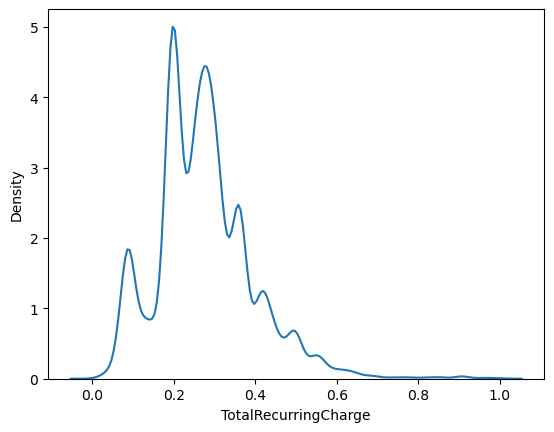

In [71]:
sns.kdeplot(x="TotalRecurringCharge", data=Churn1)

<Axes: xlabel='TotalRecurringCharge', ylabel='Density'>

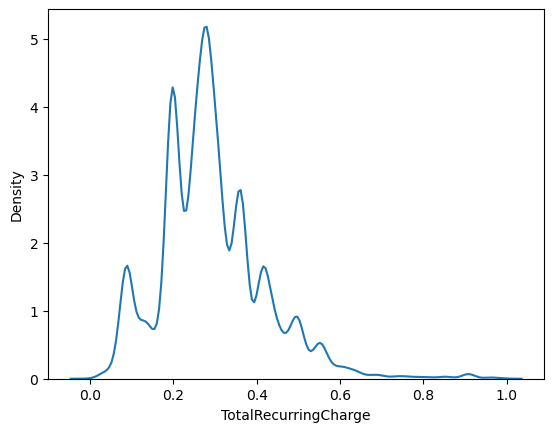

In [72]:
sns.kdeplot(x="TotalRecurringCharge", data=Churn0)